In [1]:
import os, sys

In [2]:
pip install ultralytics >/dev/null

In [34]:
import numpy as np
import pandas as pd
import time
from tqdm import tqdm
import plotly.graph_objects as go
import torch
import cv2
from ultralytics import YOLO
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [46]:
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, random_split
from torchvision import models, transforms
from PIL import Image
import seaborn as sns
from sklearn.metrics import confusion_matrix

In [4]:
pwd

'/content'

In [5]:
cd /content/drive/MyDrive/Spacecraft/classification

/content/drive/MyDrive/Spacecraft/classification


# Augmentation

Earth Pose:
 [[          1           0           0           0]
 [          0           1           0           0]
 [          0           0           1           0]
 [          0           0           0           1]]

Satellite Pose:
 [[          1           0           0           0]
 [          0           1           0           0]
 [          0           0           1           0]
 [          0           0           0           1]]

Homography Matrix:
 [[     1.2667         0.6     -83.333]
 [   -0.33333           1      66.667]
 [          0           0           1]]

Warped Satellite Pose:
 [[     1.2667         0.6           0     -83.333]
 [   -0.33333           1           0      66.667]
 [          0           0           1           0]
 [          0           0           0           1]]


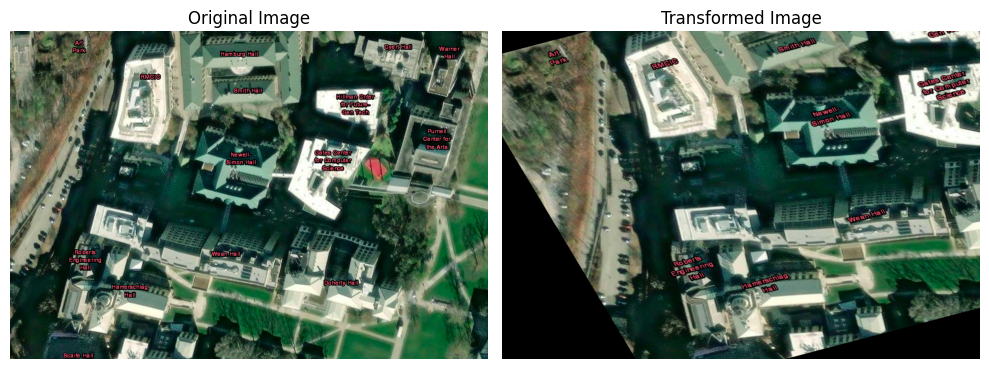

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go

# Assume a simple initial satellite pose matrix (identity matrix)
initial_satellite_pose = np.eye(4)

# Load the image
image = cv2.imread('earth.png')

# Define the points for the affine transformation
pts1 = np.float32([[50,50],[200,50],[50,200]])
pts2 = np.float32([[10,100],[200,50],[100,250]])

# Compute the affine transformation matrix
affine_matrix = cv2.getAffineTransform(pts1, pts2)

# Apply the affine transformation to the image
augmented_image = cv2.warpAffine(image, affine_matrix, (image.shape[1], image.shape[0]))

# Extend the affine transformation matrix to a homography matrix (3x3)
homography_matrix = np.eye(3)
homography_matrix[:2, :] = affine_matrix

def update_satellite_pose(initial_satellite_pose, homography_matrix):
    # Decompose the homography matrix
    rotation_matrix = homography_matrix[:2, :2]
    translation_vector = homography_matrix[:2, 2]

    # Extend to a 3x3 rotation matrix (assuming no rotation around the z-axis)
    extended_rotation = np.eye(3)
    extended_rotation[:2, :2] = rotation_matrix

    # Extend the translation vector to 3D (assuming no translation along the z-axis)
    extended_translation = np.array([translation_vector[0], translation_vector[1], 0])

    # Update the initial satellite pose
    new_satellite_pose = np.copy(initial_satellite_pose)
    new_satellite_pose[:3,:3] = np.dot(initial_satellite_pose[:3,:3], extended_rotation)
    new_satellite_pose[:3,3] = initial_satellite_pose[:3,3] + extended_translation

    return new_satellite_pose

# Update the satellite pose based on the affine transformation
new_satellite_pose = update_satellite_pose(initial_satellite_pose, homography_matrix)

# Print the satellite pose before and after the transformation
print("Earth Pose:\n", np.eye(4))  # Identity matrix, assuming the Earth is at the origin with no rotation
print("\nSatellite Pose:\n", initial_satellite_pose)
print("\nHomography Matrix:\n", homography_matrix)
print("\nWarped Satellite Pose:\n", new_satellite_pose)

def add_camera_pose(fig, pose, name):
    origin = pose[:3, 3]
    orientation = pose[:3, :3]
    # Scale the orientation for better visualization
    orientation *= 50
    # Draw the coordinate axes
    for i, color in zip(range(3), ['red', 'green', 'blue']):
        fig.add_trace(go.Scatter3d(
            x=[origin[0], origin[0] + orientation[0, i]],
            y=[origin[1], origin[1] + orientation[1, i]],
            z=[origin[2], origin[2] + orientation[2, i]],
            mode='lines',
            name=f'{name} {["X", "Y", "Z"][i]}-axis',
            line=dict(color=color)
        ))

def add_center(fig, center, name):
    fig.add_trace(go.Scatter3d(
        x=[center[0]],
        y=[center[1]],
        z=[center[2]],  # Update to reflect the z-coordinate
        mode='markers',
        marker=dict(size=10),
        name=f'{name} Image Center'
    ))

# Calculate the center of the image
image_center = np.array([image.shape[1]/2, image.shape[0]/2, 1])

# Extend to 3D (assuming the image center lies along the z-axis)
image_center_3d = np.array([0, 0, image_center[0]])  # Using x-coordinate as z-value for simplicity

# Create the figure
fig = go.Figure()

add_camera_pose(fig, initial_satellite_pose, 'Original Pose')
add_camera_pose(fig, new_satellite_pose, 'Transformed Pose')
add_center(fig, image_center_3d, 'Original')
# Assuming the transformed image center still lies along the z-axis
add_center(fig, image_center_3d, 'Transformed')

# Update layout for better visualization
fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='cube'
    ),
    margin=dict(l=0, r=0, b=0, t=0)
)

# Create a new figure using matplotlib to display images
plt.figure(figsize=(10, 5))

# Display the original and transformed images
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(augmented_image, cv2.COLOR_BGR2RGB))
plt.title('Transformed Image')
plt.axis('off')

plt.tight_layout()
plt.show()

# Display the camera poses using plotly
fig.show()


# YOLO Benchmark

In [6]:
# Load a model
model = YOLO("yolov8n.yaml")  # build a new model from scratch
model = YOLO("yolov8n.pt")  # load a pretrained model (recommended for training)


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

In [7]:
!wget https://ultralytics.com/images/bus.jpg

--2023-10-09 15:18:15--  https://ultralytics.com/images/bus.jpg
Resolving ultralytics.com (ultralytics.com)... 99.83.190.102, 75.2.70.75
Connecting to ultralytics.com (ultralytics.com)|99.83.190.102|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www.ultralytics.com/images/bus.jpg [following]
--2023-10-09 15:18:15--  https://www.ultralytics.com/images/bus.jpg
Resolving www.ultralytics.com (www.ultralytics.com)... 3.233.126.24, 34.234.52.18, 52.206.163.162
Connecting to www.ultralytics.com (www.ultralytics.com)|3.233.126.24|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://raw.githubusercontent.com/ultralytics/yolov5/master/data/images/bus.jpg [following]
--2023-10-09 15:18:16--  https://raw.githubusercontent.com/ultralytics/yolov5/master/data/images/bus.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.111.133, ...
Connecting

In [8]:
# Load the model
mds = ['m','n','s','l','x']
# model = YOLO("yolov8n.pt")  # Load a pretrained model

# Load the image
image_path = 'bus.jpg'
original_image = cv2.imread(image_path)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Convert to RGB

# Benchmark settings
batch_sizes = [1, 2, 4, 8, 16]  # Adjust as needed
image_sizes = [320, 640, 1280]  # Adjust as needed

# Storage for results
model_size_values = []
batch_size_values = []
image_size_values = []
throughput_values = []

# Benchmarking
for mod in mds:
    model = YOLO("yolov8{}.pt".format(mod))
    for batch_size in batch_sizes:
        for image_size in image_sizes:
            # Resize the image
            resized_image = cv2.resize(original_image, (image_size, image_size))
            images = torch.tensor(resized_image).permute(2, 0, 1).unsqueeze(0).float() / 255.0  # Normalize
            images = images.repeat(batch_size, 1, 1, 1)  # Create a batch

            # Warm up
            for _ in range(5):
                with torch.no_grad():
                    _ = model(images)

            # Benchmark
            start_time = time.time()
            with torch.no_grad():
                for _ in range(10):  # Adjust as needed
                    _ = model(images)
            elapsed_time = time.time() - start_time

            # Calculate throughput
            throughput = (10 * batch_size) / elapsed_time  # 10 iterations

            # Store results
            model_size_values.append(mod)
            batch_size_values.append(batch_size)
            image_size_values.append(image_size)
            throughput_values.append(throughput)


0: 1280x1280 4 persons, 1 bicycle, 2 buss, 1: 1280x1280 4 persons, 1 bicycle, 2 buss, 2: 1280x1280 4 persons, 1 bicycle, 2 buss, 3: 1280x1280 4 persons, 1 bicycle, 2 buss, 4: 1280x1280 4 persons, 1 bicycle, 2 buss, 5: 1280x1280 4 persons, 1 bicycle, 2 buss, 6: 1280x1280 4 persons, 1 bicycle, 2 buss, 7: 1280x1280 4 persons, 1 bicycle, 2 buss, 8: 1280x1280 4 persons, 1 bicycle, 2 buss, 9: 1280x1280 4 persons, 1 bicycle, 2 buss, 10: 1280x1280 4 persons, 1 bicycle, 2 buss, 11: 1280x1280 4 persons, 1 bicycle, 2 buss, 12: 1280x1280 4 persons, 1 bicycle, 2 buss, 13: 1280x1280 4 persons, 1 bicycle, 2 buss, 14: 1280x1280 4 persons, 1 bicycle, 2 buss, 15: 1280x1280 4 persons, 1 bicycle, 2 buss, 1989.4ms
Speed: 4.8ms preprocess, 124.3ms inference, 57.9ms postprocess per image at shape (1, 3, 1280, 1280)

0: 1280x1280 4 persons, 1 bicycle, 2 buss, 1: 1280x1280 4 persons, 1 bicycle, 2 buss, 2: 1280x1280 4 persons, 1 bicycle, 2 buss, 3: 1280x1280 4 persons, 1 bicycle, 2 buss, 4: 1280x1280 4 persons,

In [9]:
# Organize the data for easier plotting
data_dict = {}
for ms, bs, is_, tp in zip(model_size_values, batch_size_values, image_size_values, throughput_values):
    key = (ms, bs)
    if key not in data_dict:
        data_dict[key] = {'x': [], 'y': [], 'z': []}
    data_dict[key]['x'].append(is_)  # image size on x-axis
    data_dict[key]['y'].append(ms)   # model size on y-axis
    data_dict[key]['z'].append(tp)   # throughput on z-axis

# Create the figure
fig = go.Figure()

# Add a line for each combination of model size and batch size
for key, data in data_dict.items():
    fig.add_trace(go.Scatter3d(
        x=data['x'],
        y=data['y'],
        z=data['z'],
        mode='lines+markers',
        name=f'Model Size {key[0]}, Batch Size {key[1]}'
    ))

# Set labels and title
fig.update_layout(
    scene=dict(
        xaxis_title='Image Size',
        yaxis_title='Model Size (m:1, n:2, s:3, l:4, x:5)',
        zaxis_title='Throughput (images/second)',
    ),
    title="YOLOv8 Throughput Benchmark",
)

# Show the chart
fig.show()

# Region Data Processing

In [12]:
# !unzip landsat_ot_c2_l1_data.zip

Archive:  landsat_ot_c2_l1_data.zip
   creating: landsat_ot_c2_l1_data/15_26/
  inflating: landsat_ot_c2_l1_data/15_26/LC08_L1TP_015026_20230807_20230812_02_T1.jpg  
  inflating: landsat_ot_c2_l1_data/15_26/LC08_L1TP_015026_20230807_20230812_02_T1_MTL.txt  
   creating: landsat_ot_c2_l1_data/15_31/
  inflating: landsat_ot_c2_l1_data/15_31/LC08_L1TP_015031_20230908_20230912_02_T1.jpg  
  inflating: landsat_ot_c2_l1_data/15_31/LC08_L1TP_020031_20230911_20230918_02_T1_MTL.txt  
   creating: landsat_ot_c2_l1_data/20_26/
  inflating: landsat_ot_c2_l1_data/20_26/LC08_L1TP_020026_20230911_20230918_02_T1.jpg  
  inflating: landsat_ot_c2_l1_data/20_26/LC08_L1TP_020026_20230911_20230918_02_T1_MTL.txt  
   creating: landsat_ot_c2_l1_data/20_31/
  inflating: landsat_ot_c2_l1_data/20_31/LC08_L1TP_020031_20230911_20230918_02_T1.jpg  
  inflating: landsat_ot_c2_l1_data/20_31/LC08_L1TP_020031_20230911_20230918_02_T1_MTL.txt  
   creating: landsat_ot_c2_l1_data/25_26/
  inflating: landsat_ot_c2_l1_data

In [14]:
df = pd.read_csv('/content/drive/MyDrive/Spacecraft/classification/landsat_ot_c2_l1_metadata.csv')
df.head(10)

,LANDSAT_PRODUCT_ID,WRS_PATH,WRS_ROW,DATE_ACQUIRED,SCENE_CENTER_TIME,CLOUD_COVER,CLOUD_COVER_LAND,ROLL_ANGLE,EARTH_SUN_DISTANCE,MAP_PROJECTION,...,UTM_ZONE,ORIENTATION,CORNER_UL_LAT_PRODUCT,CORNER_UL_LON_PRODUCT,CORNER_UR_LAT_PRODUCT,CORNER_UR_LON_PRODUCT,CORNER_LL_LAT_PRODUCT,CORNER_LL_LON_PRODUCT,CORNER_LR_LAT_PRODUCT,CORNER_LR_LON_PRODUCT
0,LC08_L1TP_015026_20230807_20230812_02_T1,15,26,2023-08-07,15:43:31.3451260Z,91.72,91.72,-0.001,1.014173,UTM,...,18,NORTH_UP,49.93495,-74.94844,49.88808,-71.70317,47.81104,-74.95058,47.76752,-71.83956
1,LC08_L1TP_020031_20230911_20230918_02_T1,20,31,2023-09-11,16:16:34.9590290Z,74.57,74.57,-0.001,1.006787,UTM,...,17,NORTH_UP,42.79588,-85.17322,42.86491,-82.27315,40.63164,-85.03529,40.69564,-82.23094
2,LC08_L1TP_020026_20230911_20230918_02_T1,20,26,2023-09-11,16:14:35.5292450Z,85.29,85.29,-0.001,1.006787,UTM,...,17,NORTH_UP,49.92478,-82.72897,49.92717,-79.43954,47.77211,-82.65638,47.77433,-79.50506
3,LC08_L1TP_020031_20230911_20230918_02_T1,20,31,2023-09-11,16:16:34.9590290Z,74.57,74.57,-0.001,1.006787,UTM,...,17,NORTH_UP,42.79588,-85.17322,42.86491,-82.27315,40.63164,-85.03529,40.69564,-82.23094
4,LC08_L1TP_025031_20230610_20230614_02_T1,25,31,2023-06-10,16:46:53.0851440Z,51.17,51.17,-0.001,1.015217,UTM,...,15,NORTH_UP,42.82047,-92.78959,42.78064,-89.97313,40.71284,-92.79637,40.67583,-90.07044
5,LC08_L1TP_030026_20230715_20230724_02_T1,30,26,2023-07-15,17:16:04.5611110Z,89.68,89.68,-0.001,1.016498,UTM,...,14,NORTH_UP,49.93953,-98.09555,49.86958,-94.87336,47.82937,-98.13283,47.76439,-95.04291
6,LC08_L1TP_030031_20230731_20230805_02_T1,30,31,2023-07-31,17:18:11.9021000Z,55.97,55.97,-0.001,1.015089,UTM,...,14,NORTH_UP,42.80996,-100.56556,42.81345,-97.71445,40.67876,-100.51461,40.68199,-97.75629
7,LC08_L1TP_035026_20230920_20230926_02_T1,35,26,2023-09-20,17:47:20.4770310Z,57.60,57.60,-0.001,1.004330,UTM,...,13,NORTH_UP,49.93162,-105.88061,49.91039,-102.61270,47.79176,-105.84385,47.77205,-102.71228
8,LC08_L1TP_035031_20230904_20230912_02_T1,35,31,2023-09-04,17:49:14.0855360Z,57.24,57.24,-0.001,1.008506,UTM,...,13,NORTH_UP,42.79945,-108.32247,42.84685,-105.43568,40.64666,-108.21326,40.69063,-105.42133
9,LC08_L1TP_040031_20230502_20230509_02_T1,40,31,2023-05-02,18:19:37.2781410Z,54.35,54.35,-0.001,1.007748,UTM,...,11,NORTH_UP,42.82164,-115.99320,42.76287,-113.19680,40.72782,-116.02543,40.67319,-113.31822


In [16]:
for dirs, folders, files in os.walk('/content/drive/MyDrive/Spacecraft/classification/landsat_ot_c2_l1_data/'):
  for file in files:
    if ".jpg" in file:
      print(dirs+'/'+file)

/content/drive/MyDrive/Spacecraft/classification/landsat_ot_c2_l1_data/15_26/LC08_L1TP_015026_20230807_20230812_02_T1.jpg
/content/drive/MyDrive/Spacecraft/classification/landsat_ot_c2_l1_data/15_31/LC08_L1TP_015031_20230908_20230912_02_T1.jpg
/content/drive/MyDrive/Spacecraft/classification/landsat_ot_c2_l1_data/20_26/LC08_L1TP_020026_20230911_20230918_02_T1.jpg
/content/drive/MyDrive/Spacecraft/classification/landsat_ot_c2_l1_data/20_31/LC08_L1TP_020031_20230911_20230918_02_T1.jpg
/content/drive/MyDrive/Spacecraft/classification/landsat_ot_c2_l1_data/25_26/LC08_L1TP_025026_20230712_20230724_02_T1.jpg
/content/drive/MyDrive/Spacecraft/classification/landsat_ot_c2_l1_data/25_31/LC08_L1TP_025031_20230610_20230614_02_T1.jpg
/content/drive/MyDrive/Spacecraft/classification/landsat_ot_c2_l1_data/30_26/LC08_L1TP_030026_20230715_20230724_02_T1.jpg
/content/drive/MyDrive/Spacecraft/classification/landsat_ot_c2_l1_data/30_31/LC08_L1TP_030031_20230731_20230805_02_T1.jpg
/content/drive/MyDrive/S

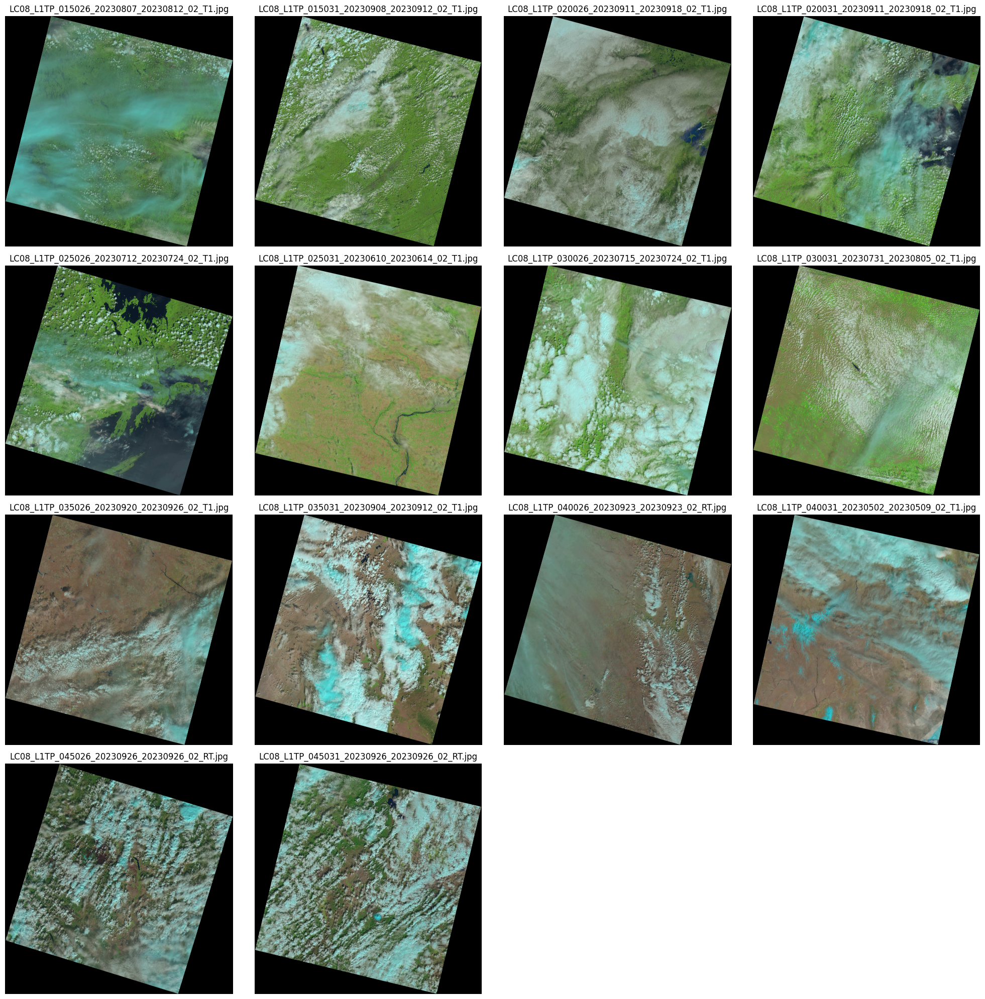

In [36]:
import os
import math
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Set the root directory
root_dir = '/content/drive/MyDrive/Spacecraft/classification/landsat_ot_c2_l1_data/'

# Get the total number of .jpg images
total_images = sum(1 for _, _, files in os.walk(root_dir) for file in files if file.endswith('.jpg'))

# Calculate grid size
grid_size = math.ceil(math.sqrt(total_images))

# Initialize a figure
fig = plt.figure(figsize=(20, 20))

# Counter for the subplot position
i = 1

# Walk through the directory
for dirs, _, files in os.walk(root_dir):
    for file in files:
        if file.endswith('.jpg'):
            # Build the full file path
            file_path = os.path.join(dirs, file)

            # Read and display the image
            img = mpimg.imread(file_path)
            ax = fig.add_subplot(grid_size, grid_size, i)  # Set grid size dynamically
            ax.imshow(img)
            ax.axis('off')  # Hide axes
            ax.set_title(file)  # Set title as the file name

            # Increment subplot position counter
            i += 1

# Adjust layout and show the figure
plt.tight_layout()
plt.show()


# Region Classificaiton

In [25]:
# Pretrained Models
# https://livingatlas.arcgis.com/en/browse/?q=dlpk%20classification#d=2&q=dlpk+classification

# Load metadata
metadata_path = "/content/drive/MyDrive/Spacecraft/classification/landsat_ot_c2_l1_metadata.csv"
metadata = pd.read_csv(metadata_path)

# Prepare image paths
metadata['image_path'] = metadata.apply(
    lambda row: f"/content/drive/MyDrive/Spacecraft/classification/landsat_ot_c2_l1_data/{row['WRS_PATH']}_{row['WRS_ROW']}/{row['LANDSAT_PRODUCT_ID']}.jpg",
    axis=1
)

# Enumerate regions
metadata['region_label'] = metadata['WRS_PATH'].astype(str) + "_" + metadata['WRS_ROW'].astype(str)
metadata['region_enum'] = metadata['region_label'].astype('category').cat.codes

metadata.head(12)

,LANDSAT_PRODUCT_ID,WRS_PATH,WRS_ROW,DATE_ACQUIRED,SCENE_CENTER_TIME,CLOUD_COVER,CLOUD_COVER_LAND,ROLL_ANGLE,EARTH_SUN_DISTANCE,MAP_PROJECTION,...,CORNER_UL_LON_PRODUCT,CORNER_UR_LAT_PRODUCT,CORNER_UR_LON_PRODUCT,CORNER_LL_LAT_PRODUCT,CORNER_LL_LON_PRODUCT,CORNER_LR_LAT_PRODUCT,CORNER_LR_LON_PRODUCT,image_path,region_label,region_enum
0,LC08_L1TP_015026_20230807_20230812_02_T1,15,26,2023-08-07,15:43:31.3451260Z,91.72,91.72,-0.001,1.014173,UTM,...,-74.94844,49.88808,-71.70317,47.81104,-74.95058,47.76752,-71.83956,/content/drive/MyDrive/Spacecraft/classificati...,15_26,0
1,LC08_L1TP_020031_20230911_20230918_02_T1,20,31,2023-09-11,16:16:34.9590290Z,74.57,74.57,-0.001,1.006787,UTM,...,-85.17322,42.86491,-82.27315,40.63164,-85.03529,40.69564,-82.23094,/content/drive/MyDrive/Spacecraft/classificati...,20_31,2
2,LC08_L1TP_020026_20230911_20230918_02_T1,20,26,2023-09-11,16:14:35.5292450Z,85.29,85.29,-0.001,1.006787,UTM,...,-82.72897,49.92717,-79.43954,47.77211,-82.65638,47.77433,-79.50506,/content/drive/MyDrive/Spacecraft/classificati...,20_26,1
3,LC08_L1TP_020031_20230911_20230918_02_T1,20,31,2023-09-11,16:16:34.9590290Z,74.57,74.57,-0.001,1.006787,UTM,...,-85.17322,42.86491,-82.27315,40.63164,-85.03529,40.69564,-82.23094,/content/drive/MyDrive/Spacecraft/classificati...,20_31,2
4,LC08_L1TP_025031_20230610_20230614_02_T1,25,31,2023-06-10,16:46:53.0851440Z,51.17,51.17,-0.001,1.015217,UTM,...,-92.78959,42.78064,-89.97313,40.71284,-92.79637,40.67583,-90.07044,/content/drive/MyDrive/Spacecraft/classificati...,25_31,3
5,LC08_L1TP_030026_20230715_20230724_02_T1,30,26,2023-07-15,17:16:04.5611110Z,89.68,89.68,-0.001,1.016498,UTM,...,-98.09555,49.86958,-94.87336,47.82937,-98.13283,47.76439,-95.04291,/content/drive/MyDrive/Spacecraft/classificati...,30_26,4
6,LC08_L1TP_030031_20230731_20230805_02_T1,30,31,2023-07-31,17:18:11.9021000Z,55.97,55.97,-0.001,1.015089,UTM,...,-100.56556,42.81345,-97.71445,40.67876,-100.51461,40.68199,-97.75629,/content/drive/MyDrive/Spacecraft/classificati...,30_31,5
7,LC08_L1TP_035026_20230920_20230926_02_T1,35,26,2023-09-20,17:47:20.4770310Z,57.60,57.60,-0.001,1.004330,UTM,...,-105.88061,49.91039,-102.61270,47.79176,-105.84385,47.77205,-102.71228,/content/drive/MyDrive/Spacecraft/classificati...,35_26,6
8,LC08_L1TP_035031_20230904_20230912_02_T1,35,31,2023-09-04,17:49:14.0855360Z,57.24,57.24,-0.001,1.008506,UTM,...,-108.32247,42.84685,-105.43568,40.64666,-108.21326,40.69063,-105.42133,/content/drive/MyDrive/Spacecraft/classificati...,35_31,7
9,LC08_L1TP_040031_20230502_20230509_02_T1,40,31,2023-05-02,18:19:37.2781410Z,54.35,54.35,-0.001,1.007748,UTM,...,-115.99320,42.76287,-113.19680,40.72782,-116.02543,40.67319,-113.31822,/content/drive/MyDrive/Spacecraft/classificati...,40_31,8


In [26]:
# Split data
train_df, test_df = train_test_split(metadata, test_size=0.2, random_state=42)

# Image preprocessing function
IMG_WIDTH = 128
IMG_HEIGHT = 128
def preprocess_image(file_path):
    img = load_img(file_path, target_size=(IMG_WIDTH, IMG_HEIGHT))
    img_array = img_to_array(img)
    return img_array / 255.0

# Preprocess images
X_train = np.stack(train_df['image_path'].apply(preprocess_image))
X_test = np.stack(test_df['image_path'].apply(preprocess_image))
y_train = train_df['region_enum'].values
y_test = test_df['region_enum'].values

# Flatten images
X_train_flat = X_train.reshape(X_train.shape[0], -1)
X_test_flat = X_test.reshape(X_test.shape[0], -1)

# Train SVM classifier
svm_clf = SVC(kernel='linear', probability=True, random_state=42)
svm_clf.fit(X_train_flat, y_train)

SVC(kernel='linear', probability=True, random_state=42)

In [29]:
# Predictions
train_predictions = svm_clf.predict(X_train_flat)
test_predictions = svm_clf.predict(X_test_flat)

# Evaluation
train_accuracy = accuracy_score(y_train, train_predictions)
test_accuracy = accuracy_score(y_test, test_predictions)
print(f"Training Accuracy: {train_accuracy}")
print(f"Test Accuracy: {test_accuracy}")

train_report = classification_report(y_train, train_predictions)
test_report = classification_report(y_test, test_predictions)
print("Training Classification Report:")
print(train_report)
print("Test Classification Report:")
print(test_report)

Training Accuracy: 1.0
Test Accuracy: 0.0
Training Classification Report:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00         2
           3       1.00      1.00      1.00         1
           4       1.00      1.00      1.00         1
           5       1.00      1.00      1.00         1
           6       1.00      1.00      1.00         1
           7       1.00      1.00      1.00         1
          10       1.00      1.00      1.00         1

    accuracy                           1.00         9
   macro avg       1.00      1.00      1.00         9
weighted avg       1.00      1.00      1.00         9

Test Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       1.0
           3       0.00      0.00      0.00       0.0
           6       0.00      0.00      0.00       0.0
           8       0.00      0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to cont

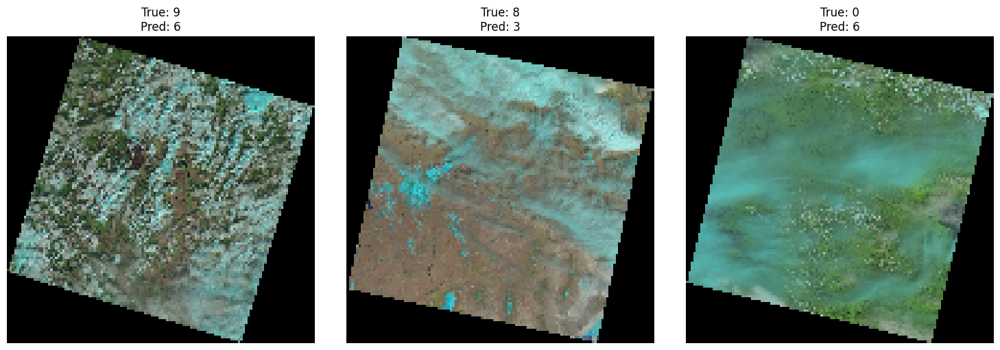

In [30]:
# Visualization function
def visualize_predictions(images, true_labels, predicted_labels):
    fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
    for img, true_label, pred_label, ax in zip(images, true_labels, predicted_labels, axes):
        ax.imshow(img)
        ax.set_title(f"True: {true_label}\nPred: {pred_label}")
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Visualize predictions
sample_images = X_test[:3]
sample_true_labels = y_test[:3]
sample_predictions = test_predictions[:3]
visualize_predictions(sample_images, sample_true_labels, sample_predictions)

In [37]:
# Training with ResNet
# Image preprocessing function
def preprocess_image(file_path):
    img = Image.open(file_path)
    img = img.resize((224, 224))
    return img

# Preprocess images
images = [preprocess_image(path) for path in metadata['image_path']]
labels = metadata['region_enum'].values

# Define base transform for normalization
base_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # ImageNet normalization
])

# Convert original images to tensors without augmentation
original_images = [base_transform(img) for img in images]
original_dataset = TensorDataset(torch.stack(original_images), torch.tensor(labels))

# Data Augmentation
aug_transforms = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(30),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    base_transform  # Apply base transform for normalization
])

num_aug_samples = 10

augmented_images = []
augmented_labels = []

for img, label in zip(images, labels):
    for _ in range(num_aug_samples):
        augmented_images.append(aug_transforms(img))
        augmented_labels.append(label)

# Convert augmented images to tensors
augmented_dataset = TensorDataset(torch.stack(augmented_images), torch.tensor(augmented_labels))

# Split data
train_size = int(0.8 * len(augmented_dataset))
test_size = len(original_dataset)  # Use original (non-augmented) dataset for testing

train_dataset, _ = random_split(augmented_dataset, [train_size, len(augmented_dataset) - train_size])
_, test_dataset = random_split(original_dataset, [len(original_dataset) - test_size, test_size])

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=4)

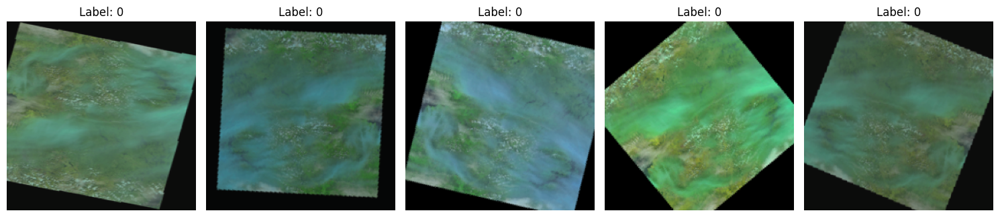

In [40]:
# Augmented Data
def visualize_images(img_list, label_list):
    fig, axes = plt.subplots(1, len(img_list), figsize=(15, 5))
    for img, ax, label in zip(img_list, axes, label_list):
        img = img.numpy().transpose((1, 2, 0))
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img = std * img + mean
        img = np.clip(img, 0, 1)
        ax.imshow(img)
        ax.set_title(f"Label: {label}")
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Visualize some augmented images
sample_idx = 0  # Index of the image you'd like to visualize
sample_images = [aug_transforms(images[sample_idx]) for _ in range(5)]  # Augment the chosen image 5 times
sample_labels = [labels[sample_idx]] * 5  # Repeated label for augmented samples

visualize_images(sample_images, sample_labels)

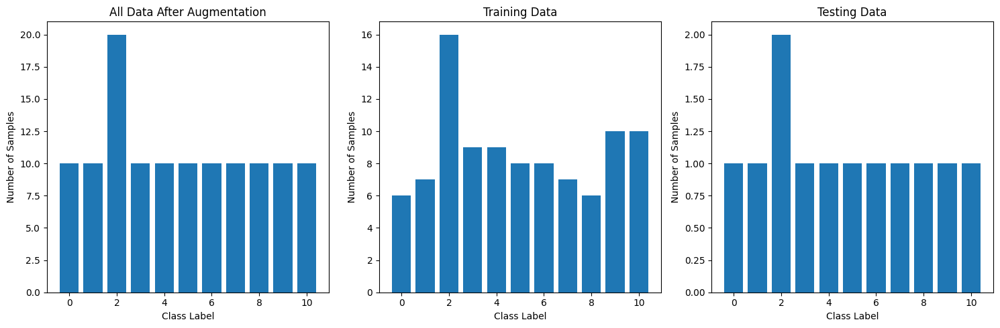

In [48]:
# Function to plot class distribution side-by-side
def plot_class_distributions(datasets, titles):
    plt.figure(figsize=(15, 5))

    for i, (data, title) in enumerate(zip(datasets, titles)):
        plt.subplot(1, 3, i+1)
        unique, counts = np.unique(data, return_counts=True)
        plt.bar(unique, counts)
        plt.title(title)
        plt.xlabel('Class Label')
        plt.ylabel('Number of Samples')

    plt.tight_layout()
    plt.show()

# Gather datasets
all_data = [augmented_labels, [label for _, label in train_dataset], [label for _, label in test_dataset]]

# Plot side-by-side
plot_class_distributions(
    all_data,
    ['All Data After Augmentation', 'Training Data', 'Testing Data']
)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning:

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.



Epoch 1/5 Loss: 2.4729
Epoch 2/5 Loss: 1.7009
Epoch 3/5 Loss: 1.5416
Epoch 4/5 Loss: 1.2851
Epoch 5/5 Loss: 1.2634
Test Accuracy: 0.5833


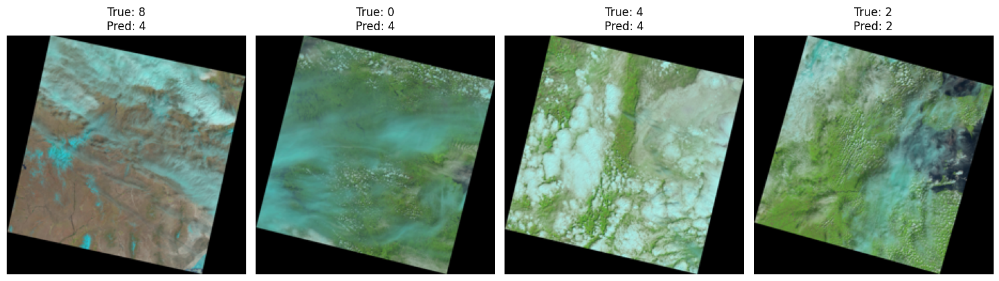

In [44]:
# Model, training, and evaluation
# Define model with pretrained ResNet
model = models.resnet18(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, len(metadata['region_enum'].unique()))

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Train the model
num_epochs = 5
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for inputs, labels in train_loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels.long())
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    epoch_loss = running_loss / len(train_loader.dataset)
    print(f"Epoch {epoch+1}/{num_epochs} Loss: {epoch_loss:.4f}")

# Evaluate model
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for inputs, labels in test_loader:
        outputs = model(inputs)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f"Test Accuracy: {correct / total:.4f}")

# Visualize predictions
def visualize_predictions(images, true_labels, predicted_labels):
    fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
    for img, true_label, pred_label, ax in zip(images, true_labels, predicted_labels, axes):
        img = img.numpy().transpose((1, 2, 0))
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img = std * img + mean
        img = np.clip(img, 0, 1)
        ax.imshow(img)
        ax.set_title(f"True: {true_label}\nPred: {pred_label}")
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Visualize some samples
samples, sample_labels = next(iter(test_loader))
sample_outputs = model(samples)
_, sample_predictions = sample_outputs.max(1)
visualize_predictions(samples, sample_labels, sample_predictions)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning:

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.



Epoch 1/5 Train Loss: 2.2707 Train Acc: 0.3125 Test Loss: 2.7521 Test Acc: 0.5000
Epoch 2/5 Train Loss: 1.6966 Train Acc: 0.4375 Test Loss: 3.5202 Test Acc: 0.3333
Epoch 3/5 Train Loss: 1.8035 Train Acc: 0.4375 Test Loss: 3.5845 Test Acc: 0.3333
Epoch 4/5 Train Loss: 1.3930 Train Acc: 0.5521 Test Loss: 1.6025 Test Acc: 0.2500
Epoch 5/5 Train Loss: 1.4372 Train Acc: 0.5104 Test Loss: 0.7775 Test Acc: 0.6667


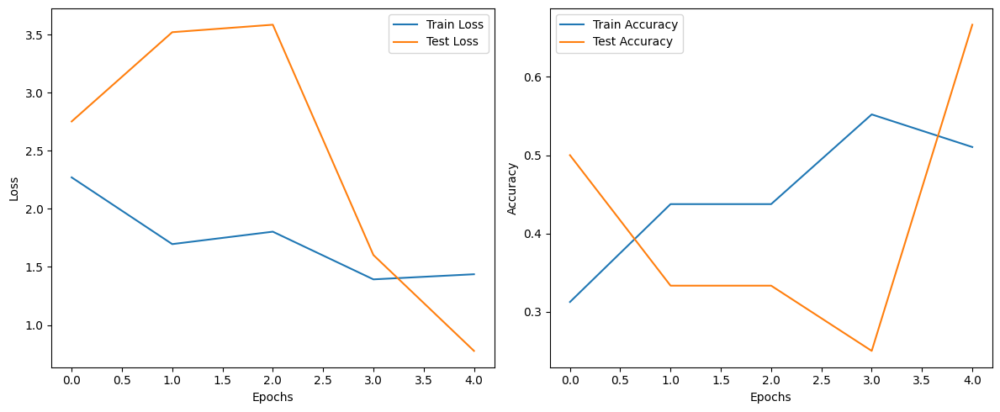

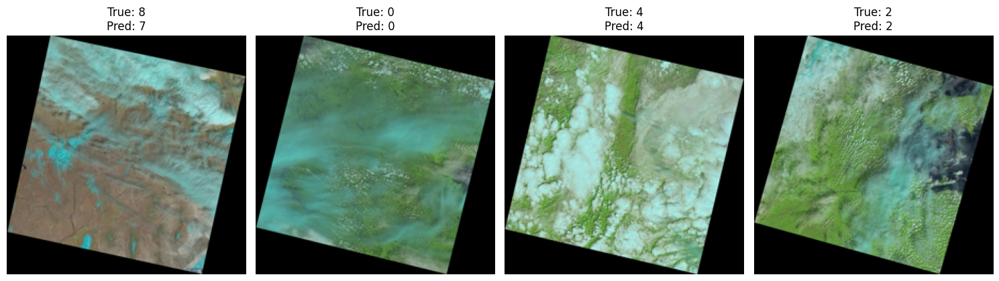

In [49]:
# Model, training, and evaluation
model = models.resnet18(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, len(metadata['region_enum'].unique()))

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

num_epochs = 5

# Lists to store training and testing metrics
train_losses = []
test_losses = []
train_accuracies = []
test_accuracies = []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct_train = 0
    total_train = 0

    for inputs, labels in train_loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels.long())
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)

        _, predicted = outputs.max(1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()

    train_acc = correct_train / total_train
    epoch_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_loss)
    train_accuracies.append(train_acc)
    # print(f"Epoch {epoch+1}/{num_epochs} Loss: {epoch_loss:.4f}")

    # Testing
    model.eval()
    test_loss = 0.0
    correct_test = 0
    total_test = 0
    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = model(inputs)
            loss = criterion(outputs, labels.long())
            test_loss += loss.item() * inputs.size(0)

            _, predicted = outputs.max(1)
            total_test += labels.size(0)
            correct_test += (predicted == labels).sum().item()

    test_acc = correct_test / total_test
    test_loss = test_loss / len(test_loader.dataset)
    test_losses.append(test_loss)
    test_accuracies.append(test_acc)

    print(f"Epoch {epoch+1}/{num_epochs} Train Loss: {epoch_loss:.4f} Train Acc: {train_acc:.4f} Test Loss: {test_loss:.4f} Test Acc: {test_acc:.4f}")

# Plot training and testing curves
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Train Accuracy')
plt.plot(test_accuracies, label='Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# Visualize Predictions
samples, sample_labels = next(iter(test_loader))
sample_outputs = model(samples)
_, sample_predictions = sample_outputs.max(1)
visualize_predictions(samples, sample_labels, sample_predictions)


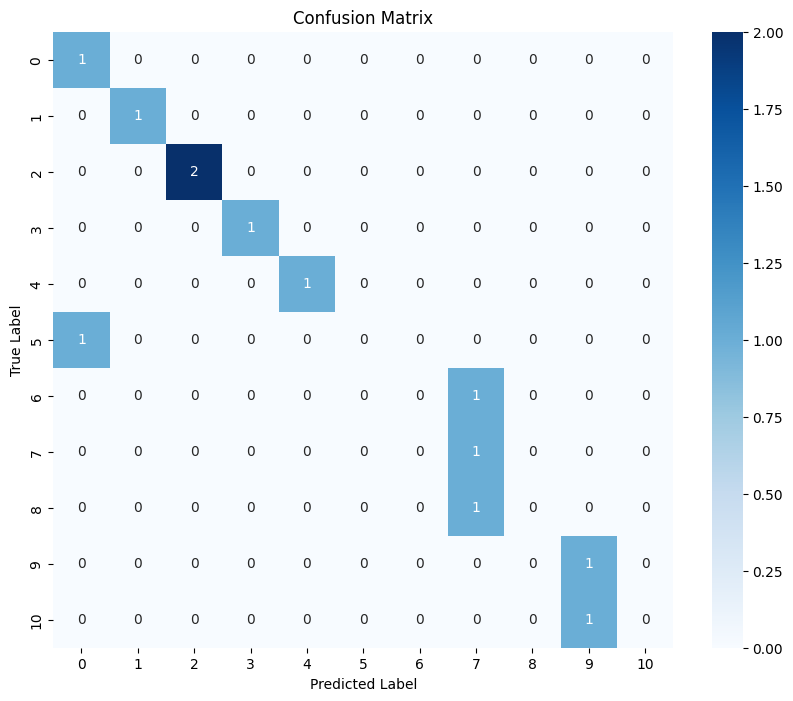

In [50]:
# Compute the confusion matrix
all_true_labels = []
all_predicted_labels = []
with torch.no_grad():
    for inputs, labels in test_loader:
        outputs = model(inputs)
        _, predicted = outputs.max(1)
        all_true_labels.extend(labels.numpy())
        all_predicted_labels.extend(predicted.numpy())

conf_matrix = confusion_matrix(all_true_labels, all_predicted_labels)

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()
